<a href="https://colab.research.google.com/github/anjanpa/CIFAR_MULTI_CLASS_CLASSIFICATION/blob/master/CIFAR_10_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1.PROBLEM STATEMENT

* Given 60000 32x32 colour images in 10 classes, with 6000 images per class, build a multiclass classification model
*There are 50000 training images and 10000 test images.

# Data 
Data is taken from https://www.tensorflow.org/datasets/catalog/cifar10

# Features 
The images are labelled with one of 10 mutually exclusive classes: airplane, automobile (but not truck or pickup truck), bird, cat, deer, dog, frog, horse, ship, and truck (but not pickup truck).

# Evaluation
 The  macro-averaged F1 score will be the evaluation metrics for the model.


## PREPARING TOOLS

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import sklearn 
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [ ]:
plt.style=('seaborn-v0_8-white')

#2.EXPLORING DATA

In [ ]:
# import data
from tensorflow import keras
(X_train, y_train), (X_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 [==============================] - 6s 0us/step


In [ ]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((50000, 32, 32, 3), (50000, 1), (10000, 32, 32, 3), (10000, 1))

## a. image feature study

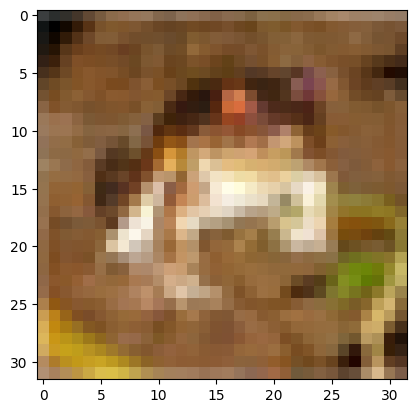

In [ ]:
plt.imshow(X_train[0])

In [ ]:
X_train[0]

array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140],
        [151, 118,  84],
        [123,  92,  72]]

In [ ]:
X_train[0][0]

array([[ 59,  62,  63],
       [ 43,  46,  45],
       [ 50,  48,  43],
       [ 68,  54,  42],
       [ 98,  73,  52],
       [119,  91,  63],
       [139, 107,  75],
       [145, 110,  80],
       [149, 117,  89],
       [149, 120,  93],
       [131, 103,  77],
       [125,  99,  76],
       [142, 115,  91],
       [144, 112,  86],
       [137, 105,  79],
       [129,  97,  71],
       [137, 106,  79],
       [134, 106,  76],
       [124,  97,  64],
       [139, 113,  78],
       [139, 112,  75],
       [133, 105,  69],
       [136, 105,  74],
       [139, 108,  77],
       [152, 120,  89],
       [163, 131, 100],
       [168, 136, 108],
       [159, 129, 102],
       [158, 130, 104],
       [158, 132, 108],
       [152, 125, 102],
       [148, 124, 103]], dtype=uint8)

In [ ]:
y_train[0]

array([6], dtype=uint8)

In [ ]:
y_train

array([[6],
       [9],
       [9],
       ...,
       [9],
       [1],
       [1]], dtype=uint8)

In [ ]:
pd.DataFrame(y_train,columns=["Result"]).Result.value_counts()
#to check whether the data is balanced or not

6    5000
9    5000
4    5000
1    5000
2    5000
7    5000
8    5000
3    5000
5    5000
0    5000
Name: Result, dtype: int64

##b. classes study

In [10]:
# Labels and description
classes=pd.DataFrame({"Label":[0,1,2,3,4,5,6,7,8,9],
                      "Description":["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]})


In [ ]:
classes

,Label,Description
0,0,airplane
1,1,automobile
2,2,bird
3,3,cat
4,4,deer
5,5,dog
6,6,frog
7,7,horse
8,8,ship
9,9,truck


In [ ]:
def display_variety(y):
  data=pd.Series(y.reshape(len(y))).value_counts()
  data.plot(kind="bar",
            cmap="summer");

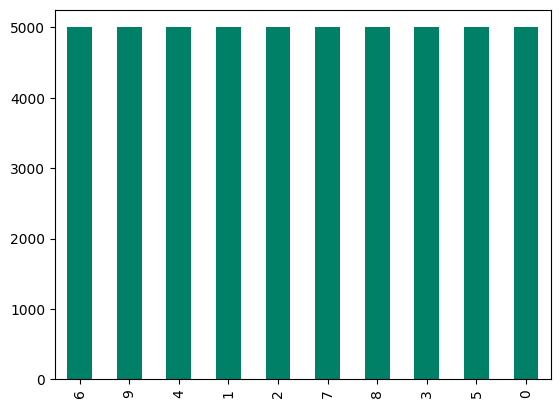

In [ ]:
display_variety(y_train)

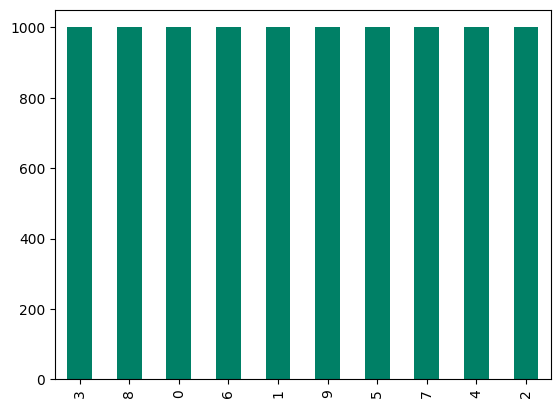

In [ ]:
display_variety(y_test)

In [11]:
labels=classes["Description"]
labels

0      airplane
1    automobile
2          bird
3           cat
4          deer
5           dog
6          frog
7         horse
8          ship
9         truck
Name: Description, dtype: object

In [12]:
cifar_class=np.array(labels)


## c.Processing labels

In [ ]:
# Turn every label into a boolean array
boolean_labels = [cifar_class[label] == np.array(cifar_class) for label in y_train]
boolean_labels[:2]

[array([False, False, False, False, False, False,  True, False, False,
        False]),
 array([False, False, False, False, False, False, False, False, False,
         True])]

In [ ]:
len(boolean_labels)

50000

In [ ]:
y_train[5]

array([1], dtype=uint8)

## d.Visualizing image

In [ ]:
def show_image(X,y): 
  plt.imshow(X)
  plt.title(np.array(labels)[y])
  plt.axis("off")



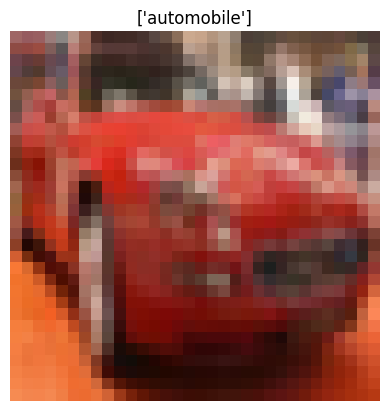

In [ ]:
show_image(X_train[5],y_train[5])

##e. Splitting into training and validation sets

In [ ]:
X=X_train
y=boolean_labels
np.random.seed(42)
from sklearn.model_selection import train_test_split
X_tr,X_val,y_tr,y_val=train_test_split(X,y,
                                       test_size=0.2,
                                       shuffle=True,
                                       random_state=42)

In [ ]:
X_tr.shape,X_val.shape

((40000, 32, 32, 3), (10000, 32, 32, 3))

In [ ]:
len(y_tr),len(y_val)

(40000, 10000)

In [ ]:
## Checking whether the data is correctly distributed or not
def check_uniform(y1):
  """
  checks whether the randomly splitted data is uniformly distributed or not
  """
  result=[np.argmax(item) for item in y1]
  result=pd.Series(result)
  fr=result.value_counts()
  fr.plot(kind="bar",cmap="summer")
  return fr




4    4067
0    4027
1    4021
7    4006
6    4004
5    3985
8    3983
3    3977
2    3970
9    3960
dtype: int64

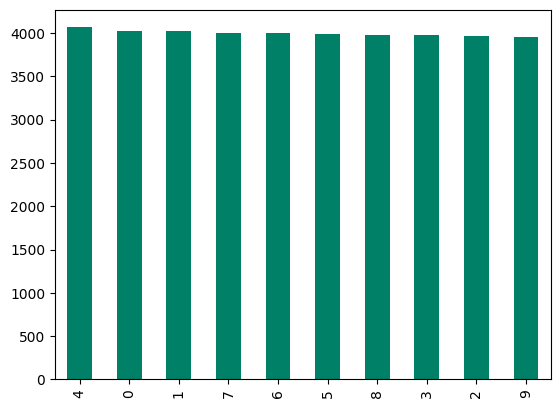

In [ ]:
check_uniform(y_tr)

9    1040
2    1030
3    1023
8    1017
5    1015
6     996
7     994
1     979
0     973
4     933
dtype: int64

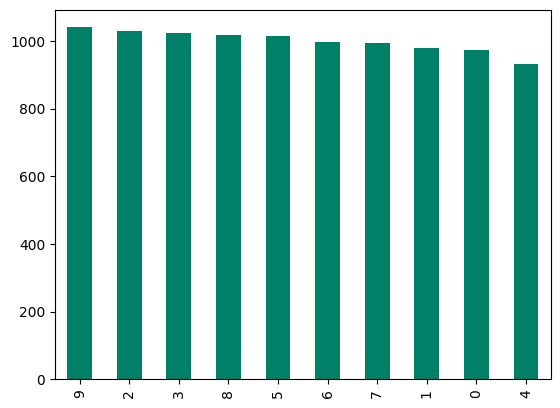

In [ ]:
check_uniform(y_val)

#3.PREPROCESSING IMAGE

##a.Converting to tensors and desired size

In [ ]:
X_train.dtype,type(X_train)

(dtype('uint8'), numpy.ndarray)

In [ ]:
tf.constant(X_train)[0]

<tf.Tensor: shape=(32, 32, 3), dtype=uint8, numpy=
array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140]

In [ ]:
#Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image, img_size=IMG_SIZE):
  """
  Takes an image and turns the image into a Tensor.
  """
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

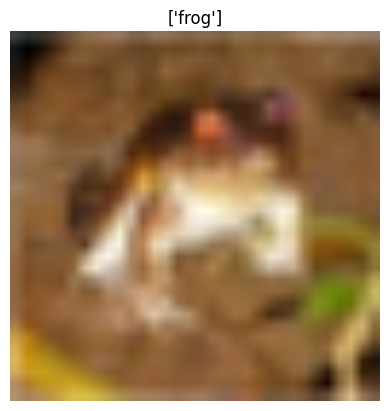

In [ ]:
show_image(process_image(X_train[0]),y_train[0])


##b.Turning data to batches

In [ ]:
def get_image_label(image, label):
  """
  Takes an image  and the assosciated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image)
  return image, label

In [ ]:
len(y_train) ,y_train[:10],y_train.dtype

(50000,
 array([[6],
        [9],
        [9],
        [4],
        [1],
        [1],
        [2],
        [7],
        [8],
        [3]], dtype=uint8),
 dtype('uint8'))

## c.Turning loaded data into batches

In [ ]:



#Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image, img_size=IMG_SIZE):
  """
  Takes an image and turns the image into a Tensor.
  """
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

def get_image_label(image, label):
  """
  Takes an image  and the assosciated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image)
  return image, label

# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
test=tf.data.Dataset.from_tensor_slices((tf.constant(X_train),tf.constant(y_train)))


In [ ]:
test.map(get_image_label)

<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(1,), dtype=tf.uint8, name=None))>

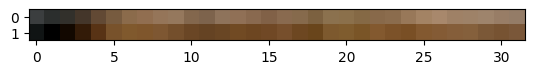

In [ ]:
plt.imshow(X_train[0][:2])

In [ ]:
X_train.shape,X_train[0][0]

((50000, 32, 32, 3),
 array([[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        [ 68,  54,  42],
        [ 98,  73,  52],
        [119,  91,  63],
        [139, 107,  75],
        [145, 110,  80],
        [149, 117,  89],
        [149, 120,  93],
        [131, 103,  77],
        [125,  99,  76],
        [142, 115,  91],
        [144, 112,  86],
        [137, 105,  79],
        [129,  97,  71],
        [137, 106,  79],
        [134, 106,  76],
        [124,  97,  64],
        [139, 113,  78],
        [139, 112,  75],
        [133, 105,  69],
        [136, 105,  74],
        [139, 108,  77],
        [152, 120,  89],
        [163, 131, 100],
        [168, 136, 108],
        [159, 129, 102],
        [158, 130, 104],
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]], dtype=uint8))

In [ ]:
for i in range(2):
  print(test.as_numpy_iterator().next())

(array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140],
        [151, 118,  84],
        [123,  92,  72]

##d.TESTING ON DUMMY IMAGES

In [ ]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog vision/labels.csv")
labels_csv.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
## Preparing images file 
filenames=["/content/drive/MyDrive/Dog vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]


['/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

dummy_labels=labels_csv["breed"]

unique_breeds=np.unique(dummy_labels)
len(unique_breeds)

# Turn every label into a boolean array
dummy_boolean_labels = [label == np.array(unique_breeds) for label in dummy_labels]
dummy_boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
test2=tf.data.Dataset.from_tensor_slices((tf.constant(filenames),tf.constant(dummy_boolean_labels)))

In [ ]:
list(test2.as_numpy_iterator())[0]

(b'/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, Fa

In [ ]:
for i in range(2):
  print(test2.as_numpy_iterator().next())

(b'/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg', array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       F

## e.Preprocessing actual data

In [ ]:
## Creating training and test data batches
train_data=create_data_batches(X_tr,y_tr)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
## Checking attributes of our data
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)))

## f.VISUALIZING DATA BATCHES

In [15]:
cifar_labels=np.array(labels)
cifar_labels


array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(cifar_labels[labels[i]][0])
    # Turn gird lines off
    plt.axis("off")

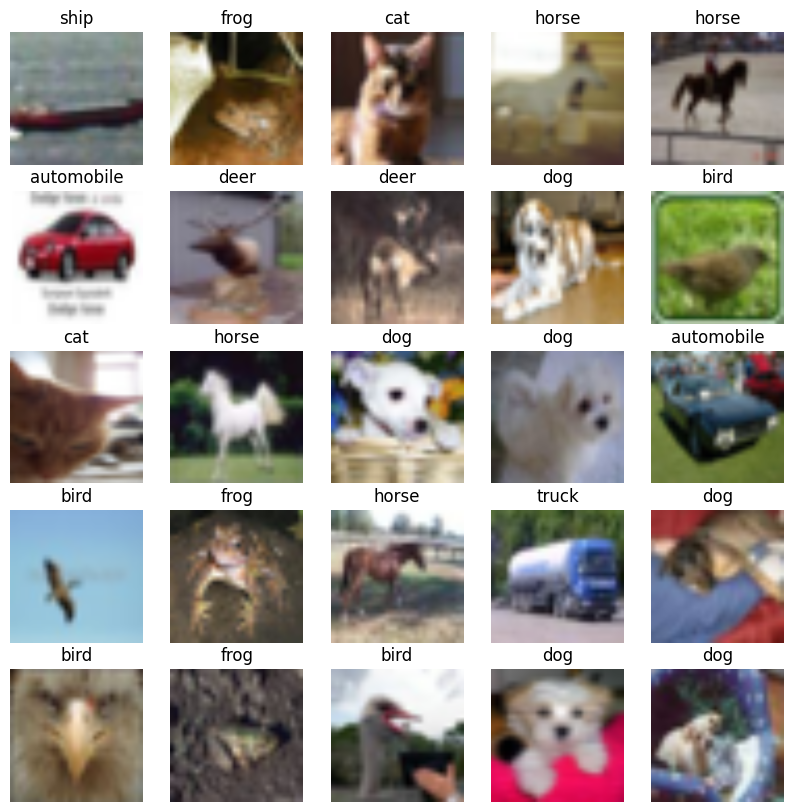

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# 4.MODELING

In [ ]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

## CREATING EVALUATION FUNCTION



In [ ]:
#function to evaluate:accuracy,precision,recall,f1-score
from sklearn.metrics import accuracy_score,precision_recall_fscore_support

def calculate_results(y_true,y_pred):
  """
  calcualtes the model accuracy,precision,recall and f1 score of a binary classification model.

  Args:
  ---
  y_true=true labels in the form of a 1D array
  y_pred=predicted labels in the form of a 1D array
  ---

  returns a dictionary of accuracy,precision,recall,f1-score
  """

  model_accuracy=accuracy_score(y_true,y_pred)*100
  model_precision,model_recall,model_f1,_=precision_recall_fscore_support(y_true,y_pred,average="weighted")
  model_results={
      "accuracy":model_accuracy,
      "precision":model_precision,
      "recall":model_recall,
      "f1":model_f1
  }
  return model_results


## CREATING CALLBACKS

### a.Tensorboard

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard
import os

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Cifar10/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### b.Earlystopping

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## MODEL 0: Creating baseline model

In [ ]:
x1,x2=next(train_data.as_numpy_iterator())

In [ ]:
x1[0].shape

(224, 224, 3)

In [ ]:
from tensorflow.keras import layers
img_height=224
img_width=224
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(img_height, 
                                                              img_width,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

In [ ]:
from tensorflow.keras import layers

#defining size
output_size=len(cifar_labels)


# Define Sequential model with 3 layers
model_0= keras.Sequential(
    [   
        data_augmentation,
        layers.Dense(20,input_shape=[IMG_SIZE,IMG_SIZE,3],activation="relu", name="layer1"),
        layers.Dense(20,activation="relu",name="layer2"),
        layers.Flatten(name="layer3"),
        layers.Dense(10,activation="softmax",name="layer4"),
    ]
)

model_0.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

model_0.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 layer1 (Dense)              (None, 224, 224, 20)      80        
                                                                 
 layer2 (Dense)              (None, 224, 224, 20)      420       
                                                                 
 layer3 (Flatten)            (None, 1003520)           0         
                                                                 
 layer4 (Dense)              (None, 10)                10035210  
                                                                 
Total params: 10,035,710
Trainable params: 10,035,710
Non-trainable params: 0
_________________________________________________________________


In [ ]:
NUM_EPOCHS = 5 #@param {type:"slider", min:10, max:100, step:10}
## Fitting the data to the model
model_0_history=model_0.fit(train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[create_tensorboard_callback(),early_stopping]
            )



Epoch 1/5
1250/1250 [==============================] - 66s 48ms/step - loss: 3.1546 - accuracy: 0.3361 - val_loss: 1.7757 - val_accuracy: 0.3757
Epoch 2/5
1250/1250 [==============================] - 67s 53ms/step - loss: 1.7952 - accuracy: 0.3662 - val_loss: 1.8112 - val_accuracy: 0.3843
Epoch 3/5
1250/1250 [==============================] - 59s 47ms/step - loss: 1.7938 - accuracy: 0.3706 - val_loss: 1.8023 - val_accuracy: 0.3577
Epoch 4/5
1250/1250 [==============================] - 59s 47ms/step - loss: 1.7705 - accuracy: 0.3745 - val_loss: 1.7305 - val_accuracy: 0.3929
Epoch 5/5
1250/1250 [==============================] - 64s 51ms/step - loss: 1.7654 - accuracy: 0.3802 - val_loss: 1.6974 - val_accuracy: 0.3996


In [ ]:
preds=model_0.predict(val_data)

313/313 [==============================] - 7s 21ms/step


In [ ]:

y_preds=[np.argmax(i) for i in preds]
y_preds[:10]

[8, 8, 8, 4, 1, 6, 8, 0, 3, 5]

In [ ]:
y_true=[np.argmax(i) for i in y_val]
y_true[:10]

[7, 8, 0, 6, 1, 6, 8, 0, 6, 5]

In [ ]:
calculate_results(y_true,y_preds)

{'accuracy': 39.96,
 'precision': 0.40780109663332603,
 'recall': 0.3996,
 'f1': 0.3968483353454593}

## MODEL 1:Creating CNN model

In [ ]:
model_1=tf.keras.Sequential([
    layers.Conv2D(filters=32,kernel_size=3,input_shape=(224,224,3),strides=(2,2),activation="relu"),

    layers.Conv2D(filters=64,kernel_size=3,activation="relu"),
    layers.MaxPool2D(pool_size=(2,2)),

    layers.Conv2D(filters=64,kernel_size=3,activation="relu"),
    layers.MaxPool2D(pool_size=(2,2)),

    layers.Dense(100,activation="softmax"),
    
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(10,activation="softmax")

])

model_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model_1.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 111, 111, 32)      896       
                                                                 
 conv2d_32 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 54, 54, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_33 (Conv2D)          (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 26, 26, 64)       0         
 g2D)                                                            
                                                                 
 dense_14 (Dense)            (None, 26, 26, 100)     

In [ ]:
model_1_history=model_0.fit(train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            # callbacks=[create_tensorboard_callback(),early_stopping]
            )



Epoch 1/5
1250/1250 [==============================] - 34s 27ms/step - loss: 0.9444 - accuracy: 0.6787 - val_loss: 3.3307 - val_accuracy: 0.3734
Epoch 2/5
1250/1250 [==============================] - 33s 27ms/step - loss: 0.9409 - accuracy: 0.6811 - val_loss: 3.3359 - val_accuracy: 0.4079
Epoch 3/5
1250/1250 [==============================] - 34s 27ms/step - loss: 0.9334 - accuracy: 0.6862 - val_loss: 3.3110 - val_accuracy: 0.3838
Epoch 4/5
1250/1250 [==============================] - 34s 27ms/step - loss: 0.9177 - accuracy: 0.6890 - val_loss: 3.3849 - val_accuracy: 0.4062
Epoch 5/5
1250/1250 [==============================] - 34s 27ms/step - loss: 0.9164 - accuracy: 0.6931 - val_loss: 3.4891 - val_accuracy: 0.3946


## MODEL 2:mobilenetv2

In [ ]:
import tensorflow_hub as hub

In [ ]:
#Defining input shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

#Setup output shape of our model
OUTPUT_SHAPE=len(cifar_labels)

#Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    
    tf.keras.layers.Dense(100,activation="relu"),
    tf.keras.layers.Dropout(.2),

    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
## create a model and check its details
model_2=create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)
model_2.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_10 (KerasLayer)  (None, 1001)             5432713   
                                                                 
 dense_20 (Dense)            (None, 100)               100200    
                                                                 
 dropout_10 (Dropout)        (None, 100)               0         
                                                                 
 dense_21 (Dense)            (None, 10)                1010      
                                                                 
Total params: 5,533,923
Trainable params: 101,210
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
# Build a function to train and return a trained model
def train_model(train_data,val_data):
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=100,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
model_2=train_model(train_data,val_data)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
1250/1250 [==============================] - 78s 59ms/step - loss: 0.5785 - accuracy: 0.8037 - val_loss: 0.4377 - val_accuracy: 0.8429
Epoch 2/100
1250/1250 [==============================] - 80s 64ms/step - loss: 0.4342 - accuracy: 0.8500 - val_loss: 0.4084 - val_accuracy: 0.8550
Epoch 3/100
1250/1250 [==============================] - 79s 63ms/step - loss: 0.3985 - accuracy: 0.8616 - val_loss: 0.3819 - val_accuracy: 0.8670
Epoch 4/100
1250/1250 [==============================] - 79s 63ms/step - loss: 0.3752 - accuracy: 0.8696 - val_loss: 0.3931 - val_accuracy: 0.8619
Epoch 5/100
1250/1250 [==============================] - 73s 58ms/step - loss: 0.3539 - accuracy: 0.8783 - val_loss: 0.3907 - val_accuracy: 0.8690
Epoch 6/100
1250/1250 [==============================] - 79s 63ms/step - loss: 0.3380 - accuracy: 0.8803 - val_loss: 0.3799 - val_accuracy: 0.8683
Epoch 7/100
1250/1250 [==

In [ ]:
model_2.evaluate(val_data)

313/313 [==============================] - 14s 46ms/step - loss: 0.4232 - accuracy: 0.8713


[0.4232117533683777, 0.8712999820709229]

## MODEL 3: RESNET

>only runnable in GPU or TPU but not CPU

In [ ]:

#Defining input shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

#Setup output shape of our model
OUTPUT_SHAPE=len(cifar_labels)

#Setup model URL from Tensorflow Hub
MODEL3_URL="https://tfhub.dev/adityakane2001/regnety600mf_feature_extractor/1"

In [ ]:
# Create a function which builds a Keras model
def create_model1(input_shape, output_shape, model_url):
  print("Building model with:", model_url)

  # Setup the model layers
  model =tf.keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/adityakane2001/regnety600mf_feature_extractor/1", trainable=False), # Can be True
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(10,activation="softmax")
    ])



  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(input_shape) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
# Build a function to train and return a trained model
def train_model1(model,train_data,val_data):
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  # model = create_model1()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=5,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
## create a model and check its details
model_3_1=create_model1(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL3_URL)
model_3_1.summary()

Building model with: https://tfhub.dev/adityakane2001/regnety600mf_feature_extractor/1
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 7, 7, 608)         5605479   
                                                                 
 global_average_pooling2d_2   (None, 608)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 10)                6090      
                                                                 
Total params: 5,611,569
Trainable params: 6,090
Non-trainable params: 5,605,479
_________________________________________________________________


In [ ]:
IMG_SIZE

224

In [ ]:
model_3=train_model1(model_3_1,train_data,val_data)

Epoch 1/5


UnimplementedError: ignored

## MODEL 4:Inception

In [ ]:

#Setup model URL from Tensorflow Hub
MODEL4_URL="https://tfhub.dev/google/imagenet/inception_v2/classification/5"

In [ ]:
## create a model and check its details
model_4=create_model1(INPUT_SHAPE,OUTPUT_SHAPE,MODEL4_URL)
model_4.summary()


Building model with: https://tfhub.dev/google/imagenet/inception_v2/classification/5
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 7, 7, 608)         5605479   
                                                                 
 global_average_pooling2d_3   (None, 608)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 10)                6090      
                                                                 
Total params: 5,611,569
Trainable params: 6,090
Non-trainable params: 5,605,479
_________________________________________________________________


In [ ]:
model_4=train_model1(model_4,train_data,val_data)

Epoch 1/5


UnimplementedError: ignored

## NOTE: Mobile net v2 is found to be the best model.

In [ ]:
## Creating training and test data batches
train_data_final=create_data_batches(X_train,boolean_labels)
val_data_final=create_data_batches(X_test,booleantest_labels,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Turn every label into a boolean array
booleantest_labels = [cifar_class[label] == np.array(cifar_class) for label in y_test]
booleantest_labels[:2]

[array([False, False, False,  True, False, False, False, False, False,
        False]),
 array([False, False, False, False, False, False, False, False,  True,
        False])]

In [ ]:
import tensorflow_hub as hub
#Defining input shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

#Setup output shape of our model
OUTPUT_SHAPE=len(cifar_labels)

#Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"



model_final= tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)

    tf.keras.layers.Dense(100,activation="relu"),
    tf.keras.layers.Dropout(.2),

    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
])

  # Compile the model
model_final.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

tensorboard=create_tensorboard_callback()

  # Build the model
model_final.build(INPUT_SHAPE)

model_final.fit(x=train_data_final,
            epochs=100,
            validation_data=val_data_final,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

Epoch 1/100
1563/1563 [==============================] - 102s 60ms/step - loss: 0.5549 - accuracy: 0.8112 - val_loss: 0.4320 - val_accuracy: 0.8544
Epoch 2/100
1563/1563 [==============================] - 87s 56ms/step - loss: 0.4294 - accuracy: 0.8515 - val_loss: 0.4002 - val_accuracy: 0.8604
Epoch 3/100
1563/1563 [==============================] - 94s 60ms/step - loss: 0.3929 - accuracy: 0.8645 - val_loss: 0.3985 - val_accuracy: 0.8636
Epoch 4/100
1563/1563 [==============================] - 94s 60ms/step - loss: 0.3710 - accuracy: 0.8706 - val_loss: 0.3951 - val_accuracy: 0.8647
Epoch 5/100
1563/1563 [==============================] - 95s 61ms/step - loss: 0.3549 - accuracy: 0.8757 - val_loss: 0.3887 - val_accuracy: 0.8694
Epoch 6/100
1563/1563 [==============================] - 94s 60ms/step - loss: 0.3370 - accuracy: 0.8818 - val_loss: 0.3929 - val_accuracy: 0.8698
Epoch 7/100
1563/1563 [==============================] - 87s 56ms/step - loss: 0.3245 - accuracy: 0.8840 - val_loss: 

In [ ]:
save_model(model_final,"finalmodel2mobilenetv2")

Saving model to: drive/My Drive/Cifar10/models/20230515-04031684123433-finalmodel2mobilenetv2.h5...


'drive/My Drive/Cifar10/models/20230515-04031684123433-finalmodel2mobilenetv2.h5'

# SAVE MODEL

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Cifar10/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

#RELOADING THE MODEL

In [3]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [4]:
import tensorflow_hub as hub
model_final_loaded=load_model("/content/drive/MyDrive/Cifar10/models/20230515-04031684123433-finalmodel2mobilenetv2.h5")
model_final_loaded.summary()

Loading saved model from: /content/drive/MyDrive/Cifar10/models/20230515-04031684123433-finalmodel2mobilenetv2.h5
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 100)               100200    
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 10)                1010      
                                                                 
Total params: 5,533,923
Trainable params: 101,210
Non-trainable params: 5,432,713
_________________________________________________________________


#5.EVALUATING ON VALIDATION DATA

In [ ]:
%tensorboard --logdir drive/My\ Drive/Cifar10/logs

Reusing TensorBoard on port 6006 (pid 11787), started 0:02:39 ago. (Use '!kill 11787' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model_final_loaded.predict(val_data_final, verbose=1) # verbose shows us how long there is to go
predictions

313/313 [==============================] - 23s 47ms/step


array([[5.72787985e-06, 1.45898603e-05, 1.10854383e-03, ...,
        3.67487024e-04, 3.32717434e-07, 1.69146115e-05],
       [1.19748309e-01, 4.57327318e-04, 4.48397675e-09, ...,
        4.46999989e-12, 8.79794359e-01, 1.39089602e-08],
       [6.50756340e-03, 1.02355011e-01, 1.28413340e-05, ...,
        7.16122440e-06, 8.90852094e-01, 4.98064546e-05],
       ...,
       [1.36241063e-09, 4.87032052e-14, 3.88642275e-06, ...,
        1.31468223e-05, 1.87854463e-12, 3.27209505e-13],
       [3.54089364e-02, 9.37481403e-01, 1.33966757e-02, ...,
        2.94935344e-05, 1.49967195e-03, 1.14193205e-02],
       [6.81455035e-08, 2.58759567e-13, 1.34572966e-08, ...,
        9.99922395e-01, 1.94889729e-11, 6.64138122e-09]], dtype=float32)

In [ ]:
predictions.shape

(10000, 10)

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return cifar_labels[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cat'

In [ ]:
for x,y in val_data_final.unbatch().as_numpy_iterator():
  print(x,y)
  break

[[[0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  ...
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]]

 [[0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  ...
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]]

 [[0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  [0.61960787 0.43921572 0.19215688]
  ...
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]
  [0.454902   0.33333334 0.12941177]]

 ...

 [[0.21176472 0.41960788 0.627451  ]
  [0.21176472 0.41960788 0.627451  ]
  [0.21176472 0.41960788 0.627451  ]
  ...
  [0.08235294 0.2627451  0.43137258]
  [0.08235294 0.2627451  0.43137258]
  [0.08235294 0.2627451  0.43137258]]

 [[0.21176472 0.41960788 0.627451  ]
  [0.21176472 0.41960788 0.627451  ]


In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(cifar_labels[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data_final)
val_images[0], val_labels[0]

(array([[[0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         ...,
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177]],
 
        [[0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         ...,
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177]],
 
        [[0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         [0.61960787, 0.43921572, 0.19215688],
         ...,
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177],
         [0.454902  , 0.33333334, 0.12941177]],
 
        ...,
 
        [[0.21176472, 0.41960788, 0.627451  ],
         [0.21176472, 0.41960788, 0.62745

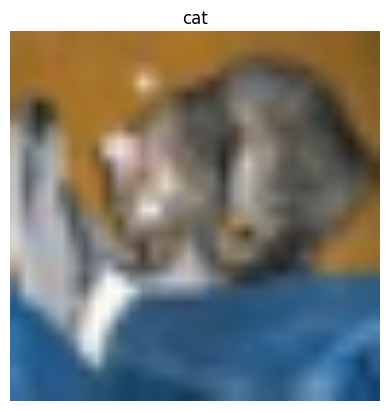

In [ ]:
plt.imshow(val_images[0])
plt.title(val_labels[0])
plt.axis("off");

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=0):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

NameError: ignored

In [ ]:
predictions[0].argsort(),predictions[0]

(array([8, 4, 0, 1, 9, 7, 6, 2, 5, 3]),
 array([5.7278799e-06, 1.4589860e-05, 1.1085438e-03, 9.8279619e-01,
        3.9475567e-06, 1.5232954e-02, 4.5338043e-04, 3.6748702e-04,
        3.3271743e-07, 1.6914611e-05], dtype=float32))

In [ ]:
t=predictions[0].argsort()[-10:][::-1] 
predictions[0][t]

array([9.8279619e-01, 1.5232954e-02, 1.1085438e-03, 4.5338043e-04,
       3.6748702e-04, 1.6914611e-05, 1.4589860e-05, 5.7278799e-06,
       3.9475567e-06, 3.3271743e-07], dtype=float32)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = cifar_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

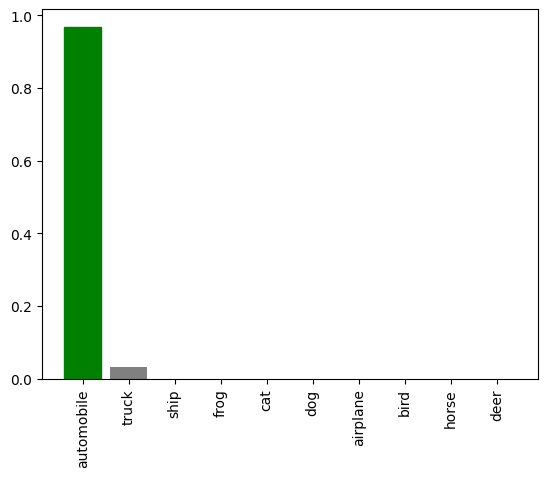

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


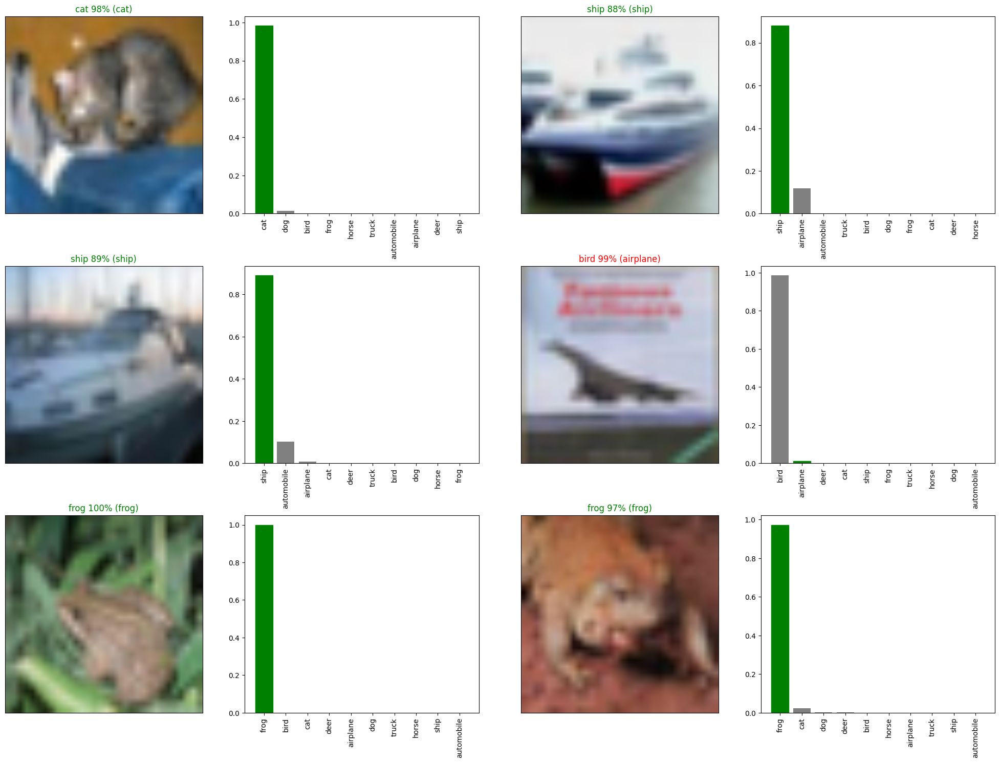

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
model_final_loaded.evaluate(val_data_final)

313/313 [==============================] - 15s 45ms/step - loss: 0.4201 - accuracy: 0.8680


[0.4200998544692993, 0.8679999709129333]

## Preprocessing for files

In [8]:

# Define image size
IMG_SIZE = 224

def fprocess_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  # image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image_path, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

# Create a simple function to return a tuple (image, label)
def fget_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = fprocess_image(image_path)
  return image, label

# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def fcreate_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(fprocess_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(fget_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(fget_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [ ]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

## TESTING ON CUSTOM DATA

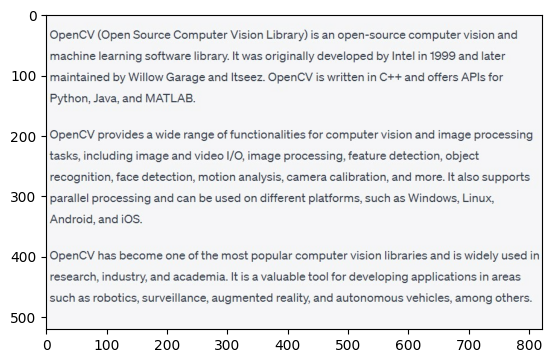

In [ ]:
plt.imshow(tf.image.decode_jpeg(tf.io.read_file("/content/test.jpg"),channels=3))


In [ ]:
custom_image

In [ ]:
custom_image="/content/drive/MyDrive/Cifar10/test_data_custom/dog1.jpg"
custom_data = fcreate_data_batches(np.array(custom_image).reshape(1), test_data=True)

Creating test data batches...


In [ ]:
test_data=create_data_batches(X_test,test_data=True)

Creating test data batches...


In [ ]:
test1=create_data_batches(np.array([X_test[0]]),test_data=True)

Creating test data batches...


In [ ]:
result=model_final_loaded.predict(test1)
result  

1/1 [==============================] - 1s 1s/step


array([[5.7277625e-06, 1.4589605e-05, 1.1085192e-03, 9.8279589e-01,
        3.9475176e-06, 1.5233218e-02, 4.5338046e-04, 3.6748432e-04,
        3.3270592e-07, 1.6914621e-05]], dtype=float32)

In [ ]:
test2=tf.data.Dataset.from_tensor_slices((tf.constant(np.array(custom_image).reshape(1))))

# test2= tf.image.decode_jpeg(test2, channels=3)
  # # Convert the colour channel values from 0-225 values to 0-1 values
  # image = tf.image.convert_image_dtype(image, tf.float32)
  # # Resize the image to our desired size (224, 244)
  # image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

In [ ]:
import cv2
test=cv2.imread("/content/airplane.png")
test=create_data_batches(np.array([test]),test_data=True)

Creating test data batches...


In [ ]:
result=model_final_loaded.predict(test)
np.argmax(result)

1/1 [==============================] - 0s 48ms/step


0

In [ ]:
cifar_labels[0]

'airplane'

In [ ]:
plt.imshow(fprocess_image(custom_image))

## TAKING LIVE PHOTO AND TESTING IT ON THE IMAGES

In [13]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  test=tf.constant(binary)
  final=fcreate_data_batches(np.array(test).reshape(1),test_data=True)
  plt.imshow(tf.image.decode_jpeg(test))
  preds=model_final_loaded.predict(final)
  plt.axis("off")
  plt.title(cifar_labels[np.argmax(preds)])

  return 0

<IPython.core.display.Javascript object>

Creating test data batches...
1/1 [==============================] - 0s 33ms/step


0

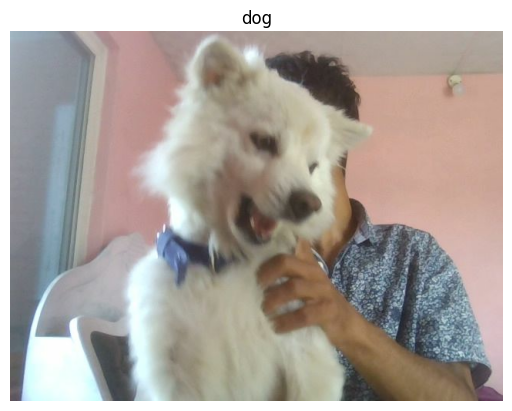

In [20]:
take_photo()

In [18]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
cifar_labels